In [1]:
import json
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from dataclasses import dataclass

from utils.graph import Graph_Viz_Engine
from utils.io import read_in
from utils.data_models import Endpoint_Record

In [2]:
# set data
page_relations = './data/outbound-requests-by-domain.json'
relations = read_in(page_relations)

# set graph
G = nx.Graph(relations)
# set positions
pos = nx.drawing.layout.spring_layout(G=G, k=.05)

print(f" --> No. news sites: {len(relations.keys())}")
print(f" > ------------------------ <")
_=[

    print(f" | ----> {site}") for site in list(relations.keys())
]

 --> No. news sites: 42
 > ------------------------ <
 | ----> nytimes.com
 | ----> www.washingtonpost.com
 | ----> thehill.com
 | ----> www.politico.com
 | ----> www.cnn.com/us
 | ----> www.reuters.com
 | ----> www.theguardian.com/us
 | ----> www.theatlantic.com
 | ----> www.latimes.com
 | ----> www.newsweek.com
 | ----> www.businessinsider.com
 | ----> www.thedailybeast.com
 | ----> www.bbc.com
 | ----> news.vice.com/en_us
 | ----> apnews.com/
 | ----> www.npr.org
 | ----> nypost.com
 | ----> www.vox.com
 | ----> nymag.com
 | ----> www.cbsnews.com
 | ----> www.foxnews.com
 | ----> www.motherjones.com
 | ----> time.com/
 | ----> www.wsj.com/
 | ----> www.yahoo.com/news/
 | ----> www.bloomberg.com
 | ----> www.aljazeera.com
 | ----> www.nydailynews.com
 | ----> www.axios.com
 | ----> www.cnbc.com
 | ----> breitbart.com
 | ----> www.infowars.com
 | ----> bipartisanreport.com
 | ----> www.theblaze.com
 | ----> www.thenation.com
 | ----> theweek.com
 | ----> www.buzzfeednews.com
 | ----> 

In [3]:
engine = Graph_Viz_Engine(
    graph=G,
    pos=pos
)
engine.fig.show()      

## outbound ->> news site

In [4]:
idx = 8
outbound_sites = list(relations.values())[idx]

o2h = {}

for site in outbound_sites:

    for homepage, outbounds in relations.items():

        if site in outbounds:

            try:
                o2h[site].append(homepage)

            except:
                o2h[site] = [homepage]

site_home = {
    f"{list(relations.keys())[idx]}" : o2h
}

site = list(site_home.keys())[0]
print(f" --> looking at: {site}")
print(f" --> looking at: {outbound_sites}")

assert list(site_home[site].keys()) == outbound_sites

_G = nx.Graph(site_home[site])
_pos = nx.drawing.layout.spring_layout(_G)


_engine = Graph_Viz_Engine(
    graph=_G,
    pos=_pos
)

_engine.fig.show()

 --> looking at: www.latimes.com
 --> looking at: ['activate.platform.californiatimes.com', '68547f8f-2fd8-4ff3-9b63-51e86e2edee8.edge.permutive.app', 'ca-times.brightspotcdn.com', 'libs.platform.californiatimes.com', 'ajax.googleapis.com', 'confiant-integrations.global.ssl.fastly.net', 'micro.rubiconproject.com', 'securepubads.g.doubleclick.net', 'ssor.platform.californiatimes.com', 'static.scroll.com', 'ads.pubmatic.com', 'c.amazon-adsystem.com', 'www.latimes.com', '68547f8f-2fd8-4ff3-9b63-51e86e2edee8.prmutv.co', 'ib.adnxs.com', 'cdn.permutive.com', 'api.permutive.com', 'rp.liadm.com', 'cdn.embed.ly', 'static.chartbeat.com', 'metering.platform.latimes.com', 'sc-static.net', 'trc.taboola.com', 'c2shb.ssp.yahoo.com', 'hbopenbid.pubmatic.com', 'bidder.criteo.com', 'fastlane.rubiconproject.com', 'latimes-d.openx.net', 'tlx.3lift.com', 'htlb.casalemedia.com', 'www.googletagmanager.com', 'activate.latimes.com', 'tr.snapchat.com', 'secure.cdn.fastclick.net', 's.amazon-adsystem.com', 'match

In [5]:
len(list(site_home[site].keys()))

69

In [6]:
len(relations[site])

69

In [7]:
outbound_search = 'acdn.adnxs.com'
site_home[site][outbound_search]

['www.latimes.com',
 'apnews.com/',
 'www.foxnews.com',
 'time.com/',
 'www.buzzfeednews.com',
 'www.nationalreview.com']

In [8]:
outbound_search = 'us-u.openx.net'
site_home[site][outbound_search]

['www.latimes.com', 'apnews.com/', 'www.theblaze.com']

In [9]:
endpoint_records = []

for endpoint in list(site_home[site].keys()):

    out = site_home[site][endpoint]

    endpoint_records.append(

        Endpoint_Record(

            endpoint=endpoint,
            outbounds=out,
            count=len(out)
        )
    )

# set dataframe
df = pd.DataFrame(endpoint_records)
sorted_df = df.sort_values('count', ascending=False).reset_index()

In [10]:
page_counter = {}

for _, outbounds in site_home.items():

    for outbound, sites in outbounds.items():

        for s in sites:

            try:

                page_counter[s] += 1

            except:

                page_counter[s] = 1

page_counter

{'www.latimes.com': 69,
 'www.politico.com': 15,
 'breitbart.com': 12,
 'www.theblaze.com': 23,
 'thehill.com': 20,
 'www.reuters.com': 17,
 'www.theguardian.com/us': 23,
 'www.businessinsider.com': 2,
 'news.vice.com/en_us': 22,
 'www.nydailynews.com': 27,
 'www.vox.com': 21,
 'nymag.com': 30,
 'time.com/': 29,
 'nytimes.com': 14,
 'www.washingtonpost.com': 16,
 'www.cnn.com/us': 11,
 'www.thedailybeast.com': 16,
 'www.bbc.com': 7,
 'apnews.com/': 24,
 'nypost.com': 19,
 'www.cbsnews.com': 1,
 'www.motherjones.com': 11,
 'www.wsj.com/': 6,
 'www.bloomberg.com': 19,
 'www.axios.com': 10,
 'www.infowars.com': 3,
 'bipartisanreport.com': 12,
 'www.buzzfeednews.com': 23,
 'thefederalist.com': 10,
 'www.redstate.com': 22,
 'www.nationalreview.com': 26,
 'www.activistpost.com': 7,
 'www.dailystar.co.uk': 12,
 'www.theatlantic.com': 6,
 'www.foxnews.com': 10,
 'www.newsweek.com': 10,
 'theweek.com': 7,
 'www.aljazeera.com': 4,
 'www.thenation.com': 4,
 'www.npr.org': 2,
 'www.cnbc.com': 1,
 

In [11]:
# analysis outbound overlap
for page in sorted(page_counter, key=page_counter.get, reverse=True):
    if page == site:
        print(f" ---> overlapping outbound requests with {page}....")
    else:
        print(f" ---> page: {page} | overlap: {round(page_counter[page]/page_counter[site], 2)*100} %")

 ---> overlapping outbound requests with www.latimes.com....
 ---> page: nymag.com | overlap: 43.0 %
 ---> page: time.com/ | overlap: 42.0 %
 ---> page: www.nydailynews.com | overlap: 39.0 %
 ---> page: www.nationalreview.com | overlap: 38.0 %
 ---> page: apnews.com/ | overlap: 35.0 %
 ---> page: www.theblaze.com | overlap: 33.0 %
 ---> page: www.theguardian.com/us | overlap: 33.0 %
 ---> page: www.buzzfeednews.com | overlap: 33.0 %
 ---> page: news.vice.com/en_us | overlap: 32.0 %
 ---> page: www.redstate.com | overlap: 32.0 %
 ---> page: www.vox.com | overlap: 30.0 %
 ---> page: thehill.com | overlap: 28.999999999999996 %
 ---> page: nypost.com | overlap: 28.000000000000004 %
 ---> page: www.bloomberg.com | overlap: 28.000000000000004 %
 ---> page: www.reuters.com | overlap: 25.0 %
 ---> page: www.washingtonpost.com | overlap: 23.0 %
 ---> page: www.thedailybeast.com | overlap: 23.0 %
 ---> page: www.politico.com | overlap: 22.0 %
 ---> page: nytimes.com | overlap: 20.0 %
 ---> page:

In [12]:
# confirm percentage
round(len(list(nx.common_neighbors(G, site, 'nymag.com')))/page_counter[site], 2)*100

43.0

In [13]:
# materialize overlapping outbound requests
list(nx.common_neighbors(G, site, 'nymag.com'))

['micro.rubiconproject.com',
 'securepubads.g.doubleclick.net',
 'c.amazon-adsystem.com',
 'ib.adnxs.com',
 'cdn.permutive.com',
 'api.permutive.com',
 'sc-static.net',
 'hbopenbid.pubmatic.com',
 'fastlane.rubiconproject.com',
 'htlb.casalemedia.com',
 'www.googletagmanager.com',
 'tr.snapchat.com',
 's.amazon-adsystem.com',
 'match.adsrvr.org',
 'www.google-analytics.com',
 'adservice.google.com',
 'api.rlcdn.com',
 'stats.g.doubleclick.net',
 'www.google.com',
 'js-sec.indexww.com',
 'static.ads-twitter.com',
 's.pinimg.com',
 'analytics.tiktok.com',
 'www.redditstatic.com',
 'connect.facebook.net',
 'pagead2.googlesyndication.com',
 'tpc.googlesyndication.com',
 'alb.reddit.com',
 'googleads.g.doubleclick.net',
 'ct.pinterest.com']

In [14]:
# first two outbound request endpoints
n = sorted_df.endpoint.iloc[0:2].tolist()

In [15]:
# count how many new sites they have in common
len(list(nx.common_neighbors(G, n[0], n[1])))

26

In [16]:
# materialize the common neighbors
list(nx.common_neighbors(G, n[0], n[1]))

['nytimes.com',
 'www.washingtonpost.com',
 'thehill.com',
 'www.politico.com',
 'www.reuters.com',
 'www.latimes.com',
 'www.thedailybeast.com',
 'news.vice.com/en_us',
 'apnews.com/',
 'nypost.com',
 'www.vox.com',
 'nymag.com',
 'www.motherjones.com',
 'time.com/',
 'www.bloomberg.com',
 'www.nydailynews.com',
 'www.axios.com',
 'breitbart.com',
 'www.infowars.com',
 'bipartisanreport.com',
 'www.theblaze.com',
 'thefederalist.com',
 'www.redstate.com',
 'www.nationalreview.com',
 'www.activistpost.com',
 'www.dailystar.co.uk']

In [17]:
top_two_sites = [
    
    (sorted_df.iloc[0], sorted_df.iloc[1]),
    (sorted_df.iloc[1], sorted_df.iloc[0])
    
    ]


for top in top_two_sites:

    s = set(top[1].outbounds)

    s3 =[ x for x in top[0].outbounds if x not in s ] # <<-- finding unique news sites for the requests in the list comprehension against s

    print(f" ---> {s3} |  not in {top[1].endpoint} in --> {top[0].endpoint}")

 ---> ['www.theatlantic.com', 'www.newsweek.com', 'www.businessinsider.com', 'www.npr.org', 'www.aljazeera.com', 'www.thenation.com', 'theweek.com'] |  not in securepubads.g.doubleclick.net in --> www.googletagmanager.com
 ---> ['www.cnn.com/us', 'www.theguardian.com/us', 'www.bbc.com', 'www.cbsnews.com', 'www.wsj.com/', 'www.buzzfeednews.com'] |  not in www.googletagmanager.com in --> securepubads.g.doubleclick.net


In [18]:
# correlation heat map to show their shared outbound requests

### NetworkX Exercises

In [19]:
G.__dict__.keys()

dict_keys(['graph', '_node', '_adj', 'adj', 'edges', 'nodes'])

In [20]:
outbound_requests = list(G.adj.keys())[-9]

In [21]:
list(nx.all_neighbors(G, 'nytimes.com'))

['g1.nyt.com',
 'www.nytimes.com',
 'static01.nyt.com',
 'www.googletagmanager.com',
 'a.et.nytimes.com',
 'samizdat-graphql.nytimes.com',
 'als-svc.nytimes.com',
 'rumcdn.geoedge.be',
 'c.amazon-adsystem.com',
 'securepubads.g.doubleclick.net',
 'nytimes-d.openx.net',
 'fastlane.rubiconproject.com',
 'prebid.media.net',
 'ib.adnxs.com',
 'tlx.3lift.com',
 's.amazon-adsystem.com',
 'sb.scorecardresearch.com',
 'dd.nytimes.com',
 'meter-svc.nytimes.com',
 'content.api.nytimes.com',
 'purr.nytimes.com',
 'a.nytimes.com',
 'adservice.google.com',
 'mwcm.nytimes.com',
 'www.google-analytics.com',
 'tags.bluekai.com',
 '5290727.fls.doubleclick.net',
 'static.chartbeat.com',
 'tags.bkrtx.com',
 'a1.nyt.com',
 'cdn.brandmetrics.com',
 'insight.adsrvr.org',
 '52699c9a8373e35393f2c392f653289f.safeframe.googlesyndication.com',
 'stags.bluekai.com',
 'pnytimes.chartbeat.net',
 'eb2.3lift.com',
 'cs.media.net',
 'dis.criteo.com',
 'medianet-match.dotomi.com',
 'pm.w55c.net',
 'u.openx.net',
 'x.bi

In [22]:
len(list(nx.non_neighbors(G, 'nytimes.com')))

755

In [23]:
nx.edges(G, ['nytimes.com', 'thehill.com'])

EdgeDataView([('nytimes.com', 'g1.nyt.com'), ('nytimes.com', 'www.nytimes.com'), ('nytimes.com', 'static01.nyt.com'), ('nytimes.com', 'www.googletagmanager.com'), ('nytimes.com', 'a.et.nytimes.com'), ('nytimes.com', 'samizdat-graphql.nytimes.com'), ('nytimes.com', 'als-svc.nytimes.com'), ('nytimes.com', 'rumcdn.geoedge.be'), ('nytimes.com', 'c.amazon-adsystem.com'), ('nytimes.com', 'securepubads.g.doubleclick.net'), ('nytimes.com', 'nytimes-d.openx.net'), ('nytimes.com', 'fastlane.rubiconproject.com'), ('nytimes.com', 'prebid.media.net'), ('nytimes.com', 'ib.adnxs.com'), ('nytimes.com', 'tlx.3lift.com'), ('nytimes.com', 's.amazon-adsystem.com'), ('nytimes.com', 'sb.scorecardresearch.com'), ('nytimes.com', 'dd.nytimes.com'), ('nytimes.com', 'meter-svc.nytimes.com'), ('nytimes.com', 'content.api.nytimes.com'), ('nytimes.com', 'purr.nytimes.com'), ('nytimes.com', 'a.nytimes.com'), ('nytimes.com', 'adservice.google.com'), ('nytimes.com', 'mwcm.nytimes.com'), ('nytimes.com', 'www.google-ana

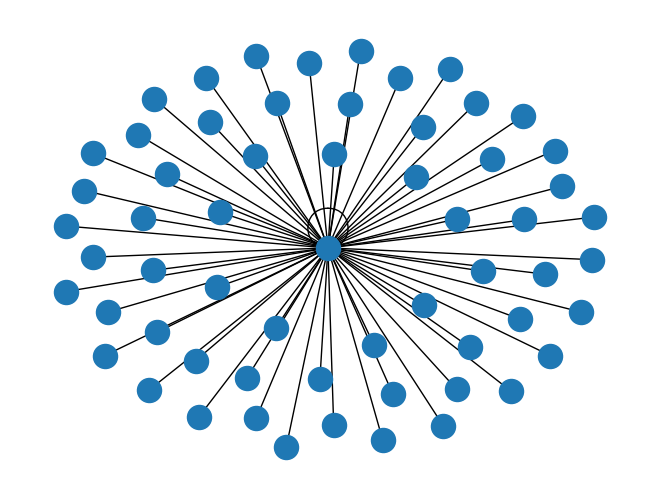

In [24]:
nx.draw(nx.ego_graph(G, 'thehill.com'))

In [25]:
nx.density(G)

0.005975099610873191

In [26]:
len(list(nx.non_edges(G)))


320110

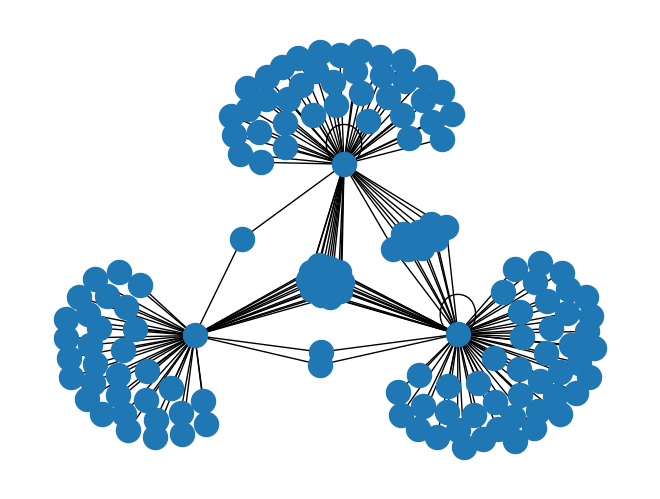

In [27]:
nx.draw(nx.edge_subgraph(G, nx.edges(G, ['nytimes.com', 'thehill.com', 'www.latimes.com'])))

In [28]:
for node, degree in dict(nx.degree(G)).items():
    
    if degree == max(list(dict(nx.degree(G)).values())):
        print(node)

www.nationalreview.com


In [29]:
G['thehill.com']

AtlasView({'ccpa.psg.nexstardigital.net': {}, 'thehill.com': {}, 'blue.thehill.com': {}, '3a6b0682-f3e1-4576-a706-5eb4101b9cc3.edge.permutive.app': {}, 'static.chartbeat.com': {}, 'cdn.onesignal.com': {}, 'securepubads.g.doubleclick.net': {}, 'fonts.googleapis.com': {}, 'ak.sail-horizon.com': {}, 'segment.psg.nexstardigital.net': {}, 'w3.mp.lura.live': {}, 'confiant-integrations.global.ssl.fastly.net': {}, 'widgets.jobbio.com': {}, 'd15kdpgjg3unno.cloudfront.net': {}, 'stats.wp.com': {}, 'bob.dmpxs.com': {}, 'c.amazon-adsystem.com': {}, 'www.googletagmanager.com': {}, 'c.aaxads.com': {}, '3a6b0682-f3e1-4576-a706-5eb4101b9cc3.prmutv.co': {}, 'ib.adnxs.com': {}, 'cdn.permutive.com': {}, 'api.permutive.com': {}, 'dyv1bugovvq1g.cloudfront.net': {}, 'partner-api.jobbio.com': {}, 'www.aaxdetect.com': {}, 'pagead2.googlesyndication.com': {}, 'cdn.segment.com': {}, 'pixel.wp.com': {}, 'onesignal.com': {}, 'www.google-analytics.com': {}, 's.ntv.io': {}, 'cm2.lotlinx.com': {}, 'sb.scorecardresea

In [30]:
G['www.latimes.com']

AtlasView({'activate.platform.californiatimes.com': {}, '68547f8f-2fd8-4ff3-9b63-51e86e2edee8.edge.permutive.app': {}, 'ca-times.brightspotcdn.com': {}, 'libs.platform.californiatimes.com': {}, 'ajax.googleapis.com': {}, 'confiant-integrations.global.ssl.fastly.net': {}, 'micro.rubiconproject.com': {}, 'securepubads.g.doubleclick.net': {}, 'ssor.platform.californiatimes.com': {}, 'static.scroll.com': {}, 'ads.pubmatic.com': {}, 'c.amazon-adsystem.com': {}, 'www.latimes.com': {}, '68547f8f-2fd8-4ff3-9b63-51e86e2edee8.prmutv.co': {}, 'ib.adnxs.com': {}, 'cdn.permutive.com': {}, 'api.permutive.com': {}, 'rp.liadm.com': {}, 'cdn.embed.ly': {}, 'static.chartbeat.com': {}, 'metering.platform.latimes.com': {}, 'sc-static.net': {}, 'trc.taboola.com': {}, 'c2shb.ssp.yahoo.com': {}, 'hbopenbid.pubmatic.com': {}, 'bidder.criteo.com': {}, 'fastlane.rubiconproject.com': {}, 'latimes-d.openx.net': {}, 'tlx.3lift.com': {}, 'htlb.casalemedia.com': {}, 'www.googletagmanager.com': {}, 'activate.latimes.

In [31]:
list((n for n in G['nytimes.com'] if n in G['www.latimes.com'] and n not in ('nytimes.com', 'www.latimes.com')))

['www.googletagmanager.com',
 'c.amazon-adsystem.com',
 'securepubads.g.doubleclick.net',
 'fastlane.rubiconproject.com',
 'ib.adnxs.com',
 'tlx.3lift.com',
 's.amazon-adsystem.com',
 'adservice.google.com',
 'www.google-analytics.com',
 'static.chartbeat.com',
 'eb2.3lift.com',
 'pagead2.googlesyndication.com',
 'tpc.googlesyndication.com',
 'www.google.com']

In [32]:
list(nx.common_neighbors(G, 'nytimes.com', 'www.latimes.com'))

['www.googletagmanager.com',
 'c.amazon-adsystem.com',
 'securepubads.g.doubleclick.net',
 'fastlane.rubiconproject.com',
 'ib.adnxs.com',
 'tlx.3lift.com',
 's.amazon-adsystem.com',
 'adservice.google.com',
 'www.google-analytics.com',
 'static.chartbeat.com',
 'eb2.3lift.com',
 'pagead2.googlesyndication.com',
 'tpc.googlesyndication.com',
 'www.google.com']

In [33]:
nx.node_connectivity(G, 'nytimes.com', 'www.latimes.com')

20

In [34]:
# dict(nx.all_pairs_shortest_path(G))

In [35]:
list(G.edges())[0]

('nytimes.com', 'g1.nyt.com')

In [36]:
G.edges[list(G.edges.keys())[0]]

{}

In [37]:
import matplotlib.colors as clr

In [38]:
relations.keys()

dict_keys(['nytimes.com', 'www.washingtonpost.com', 'thehill.com', 'www.politico.com', 'www.cnn.com/us', 'www.reuters.com', 'www.theguardian.com/us', 'www.theatlantic.com', 'www.latimes.com', 'www.newsweek.com', 'www.businessinsider.com', 'www.thedailybeast.com', 'www.bbc.com', 'news.vice.com/en_us', 'apnews.com/', 'www.npr.org', 'nypost.com', 'www.vox.com', 'nymag.com', 'www.cbsnews.com', 'www.foxnews.com', 'www.motherjones.com', 'time.com/', 'www.wsj.com/', 'www.yahoo.com/news/', 'www.bloomberg.com', 'www.aljazeera.com', 'www.nydailynews.com', 'www.axios.com', 'www.cnbc.com', 'breitbart.com', 'www.infowars.com', 'bipartisanreport.com', 'www.theblaze.com', 'www.thenation.com', 'theweek.com', 'www.buzzfeednews.com', 'thefederalist.com', 'www.redstate.com', 'www.nationalreview.com', 'www.activistpost.com', 'www.dailystar.co.uk'])

In [39]:
newsite_color_map = {}

cmap = list(clr.CSS4_COLORS.keys())

for idx, site in enumerate(relations.keys()):

    newsite_color_map[site] =  clr.CSS4_COLORS[cmap[idx+10]]



In [40]:
newsite_color_map

{'nytimes.com': '#8A2BE2',
 'www.washingtonpost.com': '#A52A2A',
 'thehill.com': '#DEB887',
 'www.politico.com': '#5F9EA0',
 'www.cnn.com/us': '#7FFF00',
 'www.reuters.com': '#D2691E',
 'www.theguardian.com/us': '#FF7F50',
 'www.theatlantic.com': '#6495ED',
 'www.latimes.com': '#FFF8DC',
 'www.newsweek.com': '#DC143C',
 'www.businessinsider.com': '#00FFFF',
 'www.thedailybeast.com': '#00008B',
 'www.bbc.com': '#008B8B',
 'news.vice.com/en_us': '#B8860B',
 'apnews.com/': '#A9A9A9',
 'www.npr.org': '#006400',
 'nypost.com': '#A9A9A9',
 'www.vox.com': '#BDB76B',
 'nymag.com': '#8B008B',
 'www.cbsnews.com': '#556B2F',
 'www.foxnews.com': '#FF8C00',
 'www.motherjones.com': '#9932CC',
 'time.com/': '#8B0000',
 'www.wsj.com/': '#E9967A',
 'www.yahoo.com/news/': '#8FBC8F',
 'www.bloomberg.com': '#483D8B',
 'www.aljazeera.com': '#2F4F4F',
 'www.nydailynews.com': '#2F4F4F',
 'www.axios.com': '#00CED1',
 'www.cnbc.com': '#9400D3',
 'breitbart.com': '#FF1493',
 'www.infowars.com': '#00BFFF',
 'bip

In [41]:
for edge in G.edges():
    G.edges[edge]['color'] = newsite_color_map[edge[0]]

In [42]:
G.edges[edge]

{'color': '#FFD700'}

In [43]:
engine_ = Graph_Viz_Engine(
    graph=G,
    pos=pos
)
engine_.fig.show()   

In [44]:
nx.edges(G, ['nytimes.com'])

EdgeDataView([('nytimes.com', 'g1.nyt.com'), ('nytimes.com', 'www.nytimes.com'), ('nytimes.com', 'static01.nyt.com'), ('nytimes.com', 'www.googletagmanager.com'), ('nytimes.com', 'a.et.nytimes.com'), ('nytimes.com', 'samizdat-graphql.nytimes.com'), ('nytimes.com', 'als-svc.nytimes.com'), ('nytimes.com', 'rumcdn.geoedge.be'), ('nytimes.com', 'c.amazon-adsystem.com'), ('nytimes.com', 'securepubads.g.doubleclick.net'), ('nytimes.com', 'nytimes-d.openx.net'), ('nytimes.com', 'fastlane.rubiconproject.com'), ('nytimes.com', 'prebid.media.net'), ('nytimes.com', 'ib.adnxs.com'), ('nytimes.com', 'tlx.3lift.com'), ('nytimes.com', 's.amazon-adsystem.com'), ('nytimes.com', 'sb.scorecardresearch.com'), ('nytimes.com', 'dd.nytimes.com'), ('nytimes.com', 'meter-svc.nytimes.com'), ('nytimes.com', 'content.api.nytimes.com'), ('nytimes.com', 'purr.nytimes.com'), ('nytimes.com', 'a.nytimes.com'), ('nytimes.com', 'adservice.google.com'), ('nytimes.com', 'mwcm.nytimes.com'), ('nytimes.com', 'www.google-ana

In [45]:
filtered_engine = Graph_Viz_Engine(
    graph=G,
    pos=pos,
    node_cmap=newsite_color_map,
    auto=False
)

filtered_engine.build_edge_sets()
filtered_engine.build_node_vectors()
filtered_engine.set_node_trace()
filtered_engine.set_node_details()
filtered_engine.build_figure(filtered=True)

In [46]:
filtered_engine.fig.show()